In [ ]:
import cv2
from google.colab.patches import cv2_imshow
import matplotlib.pyplot as plt

In [ ]:
image=cv2.imread("/content/bird.jpg")

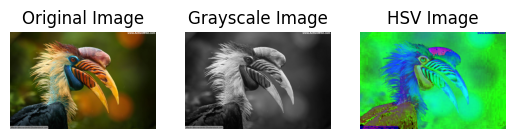

In [ ]:
plt.subplot(1,3,1)
plt.imshow(cv2.cvtColor(image,cv2.COLOR_BGR2RGB))
plt.axis('off')
plt.title("Original Image")

plt.subplot(1,3,2)
plt.imshow(cv2.cvtColor(image,cv2.COLOR_BGR2GRAY),cmap='gray')
plt.title("Grayscale Image")
plt.axis('off')

plt.subplot(1,3,3)
plt.imshow(cv2.cvtColor(image,cv2.COLOR_BGR2HSV),cmap='gray')
plt.title("HSV Image")
plt.axis('off')
plt.show();

# Prac 8A

In [ ]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow
from google.colab import files

In [ ]:
uploaded = files.upload()

Saving Shoebill.webp to Shoebill.webp


In [ ]:
image = cv2.imread(list(uploaded.keys())[0])
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

In [ ]:
# sobel operator (X and Y)
sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=3)
sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=3)
sobel_combined = cv2.magnitude(sobelx, sobely)

The Sobel operator is a discrete differentiation technique in computer vision used to detect edges by calculating the gradient magnitude and direction of image intensity, typically emphasizing horizontal and vertical changes.


In [ ]:
# Laplacian Operator
laplacian = cv2.Laplacian(gray, cv2.CV_64F)

The Laplacian operator in computer vision is a second-order derivative filter used to highlight regions of rapid intensity change, effectively detecting edges by measuring the rate at which pixel intensity varies in all directions.


In [ ]:
# Canny edge detection
canny = cv2.Canny(gray, 100, 200)

The Canny operator is a multi-stage edge detection algorithm in computer vision that identifies optimal edges by applying Gaussian smoothing, computing intensity gradients, performing non-maximum suppression, and using hysteresis thresholding to track edge continuity.


Original Image: 


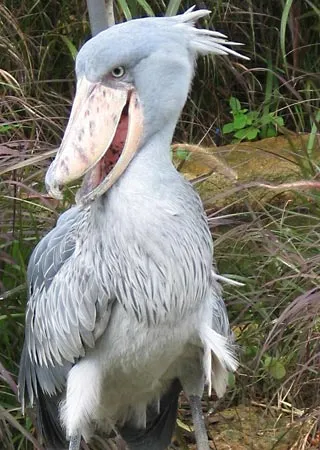

GrayScale Image: 


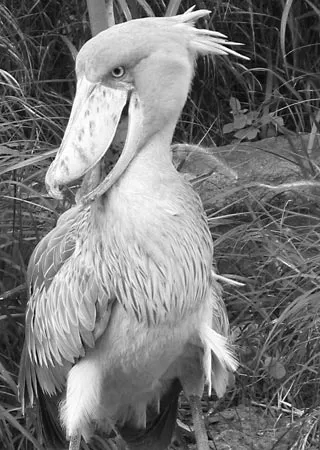

Sobel X: 


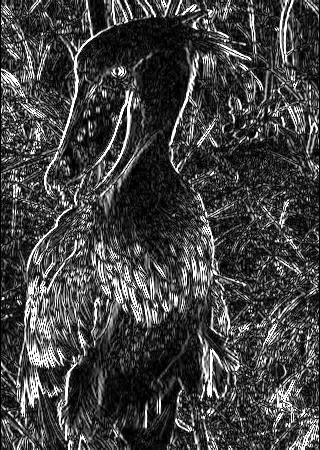

Sobel Y: 


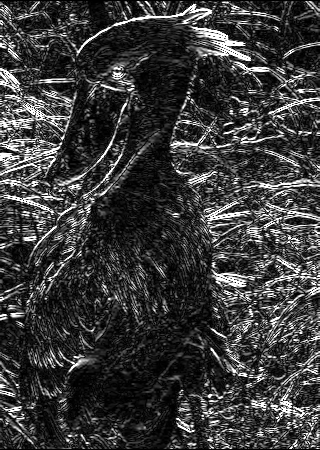

Sobel Combined (Magnitude): 


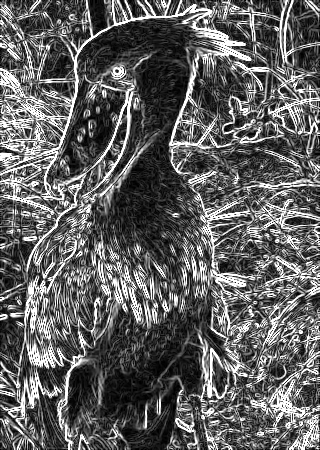

Laplacian: 


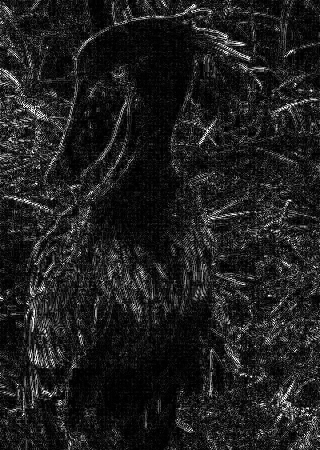

Canny Edge Detection: 


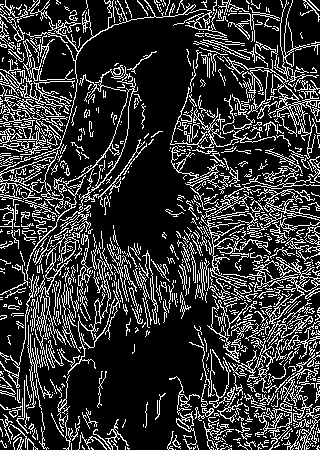

In [ ]:
print("Original Image: ")
cv2_imshow(image)

print("GrayScale Image: ")
cv2_imshow(gray)

print("Sobel X: ")
cv2_imshow(cv2.convertScaleAbs(sobelx))

print("Sobel Y: ")
cv2_imshow(cv2.convertScaleAbs(sobely))

print("Sobel Combined (Magnitude): ")
cv2_imshow(cv2.convertScaleAbs(sobel_combined))

print("Laplacian: ")
cv2_imshow(cv2.convertScaleAbs(laplacian))

print("Canny Edge Detection: ")
cv2_imshow(canny)

# Prac 8B

In [ ]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow
from google.colab import files
import matplotlib.pyplot as plt

In [ ]:
# Step 1: Upload Image
uploaded = files.upload()

Saving 5 Most Unique Birds in the World!.jpg to 5 Most Unique Birds in the World! (1).jpg


In [ ]:
# Step 2: Load and convert to grayscale
filename = list(uploaded.keys())[0]
img = cv2.imread(filename, cv2.IMREAD_GRAYSCALE)

In [ ]:
# Step 3: 2D DFT using FFT
dft = np.fft.fft2(img)
dft_shifted = np.fft.fftshift(dft)
plt.magnitude_spectrum = 20 * np.log(np.abs(dft_shifted) + 1)

 ### np.fft.fft2
- Computes the 2-dimensional Fast Fourier Transform (FFT) of an image or 2D array.

### np.fft.fftshift
- Shifts the zero-frequency component (DC component) of the FFT output to the center of the spectrum.



In [ ]:
# Step 4: 2D DCT using OpenCV
img_float = np.float32(img)
dct = cv2.dct(img_float)
dct_log = np.log(np.abs(dct) + 1)

The Discrete Cosine Transform (DCT) is a technique in computer vision and signal processing that transforms an image or signal from the spatial domain to the frequency domain using only cosine functions, making it highly effective for image compression (like JPEG) by concentrating energy in a few low-frequency components.


Original GrayScale Image: 


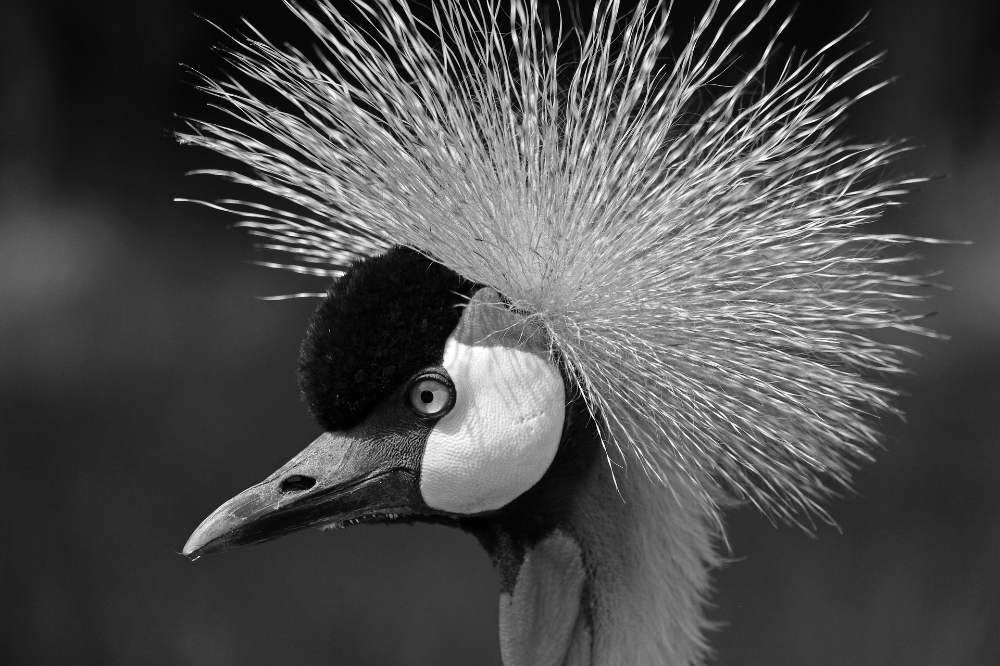

DFT Magnitude Spectrum: 


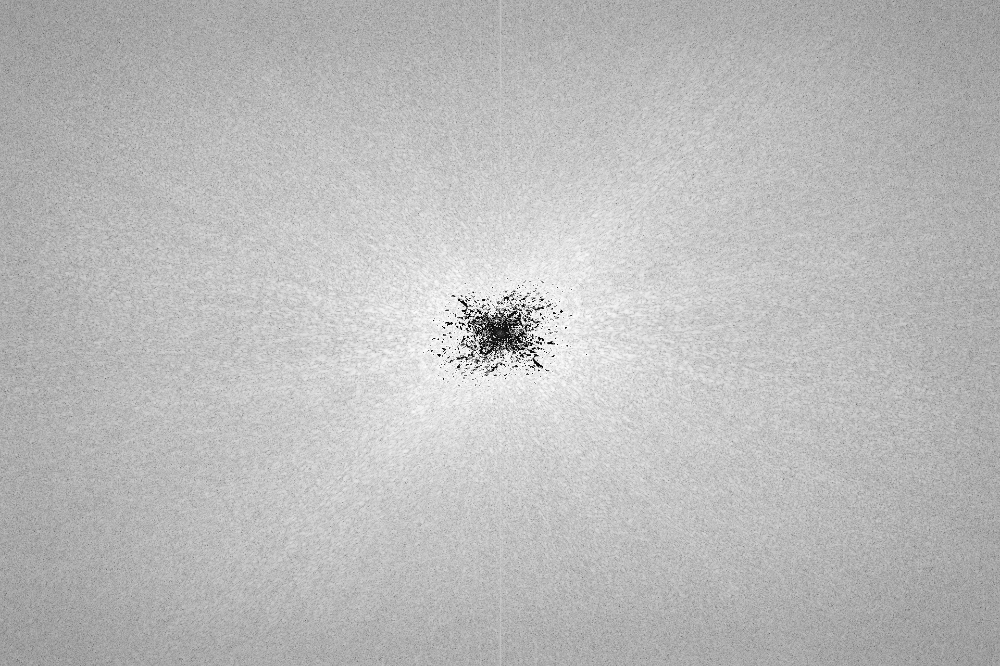

DCT Coefficients (Log scaled)


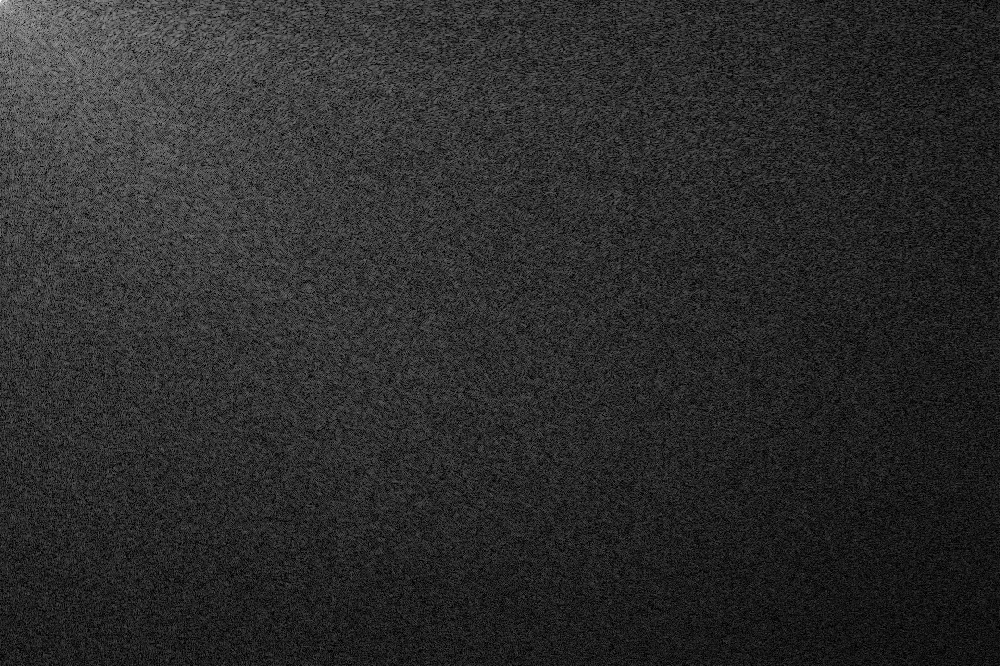

In [ ]:
# Step 5:  Display results
print("Original GrayScale Image: ")
cv2_imshow(img)

print("DFT Magnitude Spectrum: ")
cv2_imshow(np.uint8(plt.magnitude_spectrum))

print("DCT Coefficients (Log scaled)")
cv2_imshow(np.uint8(255*dct_log/np.max(dct_log)))

The magnitude spectrum in computer vision represents the strength of different frequency components in an image after applying a Fourier Transform, helping visualize how much of the image's structure is made up of low vs. high frequencies.


# 8C

In [ ]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow
from google.colab import files
import matplotlib.pyplot as plt

In [ ]:
uploaded = files.upload()
filename = list(uploaded.keys())[0]


Saving Knobbed-Hornbill-Male.jpg to Knobbed-Hornbill-Male.jpg


In [ ]:
# Step 2: Read and convert to grayscale
img = cv2.imread(filename, cv2.IMREAD_GRAYSCALE)

In [ ]:
# Step 3: Perform 2D DFT and shift zero frequency to center
dft = np.fft.fft2(img)
dft_shift = np.fft.ifftshift(dft)

The np.fft.ifftshift function reverses the effect of fftshift, moving the zero-frequency component (DC component) back to the original corner of the array, which is necessary before applying the inverse FFT (ifft2) to correctly reconstruct the spatial domain image.


In [ ]:
# Step 4: Create filters
rows, cols = img.shape
crow, ccol = rows // 2, cols // 2

array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]], dtype=uint8)
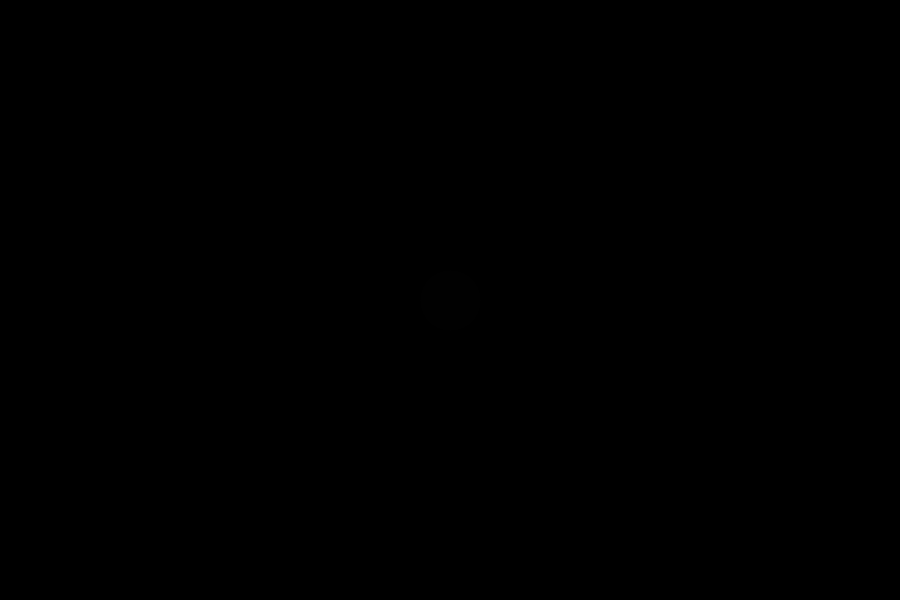

In [ ]:
# Low-pass filter (center circle 30px radius)
lp_filter = np.zeros((rows, cols), np.uint8)
cv2.circle(lp_filter, (ccol, crow), 30, 1, thickness=-1)

In [ ]:
# High pass filter (invert of low-pass)
hp_filter = 1 - lp_filter

In [ ]:
# Step 5: Apply filters
# Low-pass
dft_lp = dft_shift * lp_filter
img_lp = np.fft.ifft2(np.fft.ifftshift(dft_lp))
img_lp = np.abs(img_lp)

In [ ]:
# High-pass
dft_hp = dft_shift * hp_filter
img_hp = np.fft.ifft2(np.fft.ifftshift(dft_hp))
img_hp = np.abs(img_hp)

Original Image: 


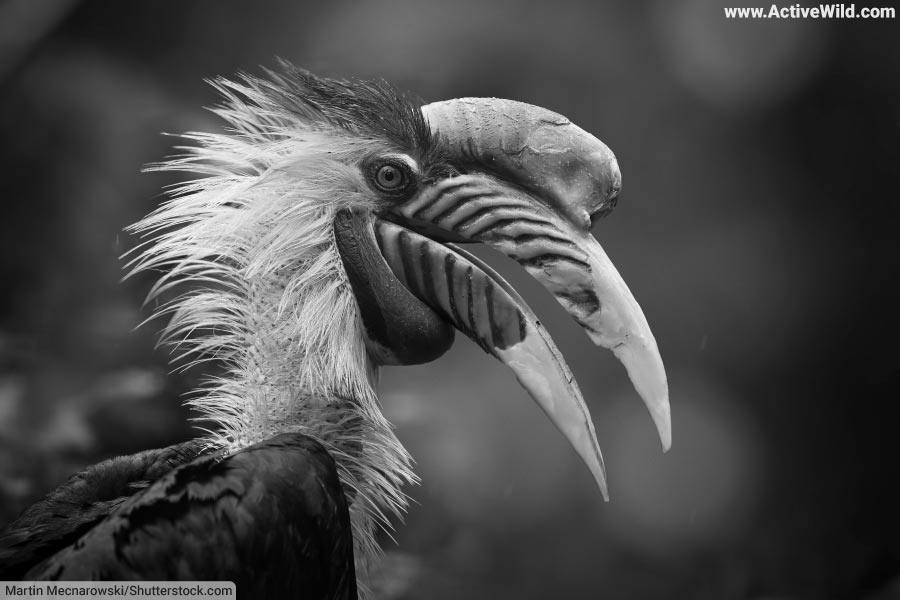

Low-pass filtered image (smoothed): 


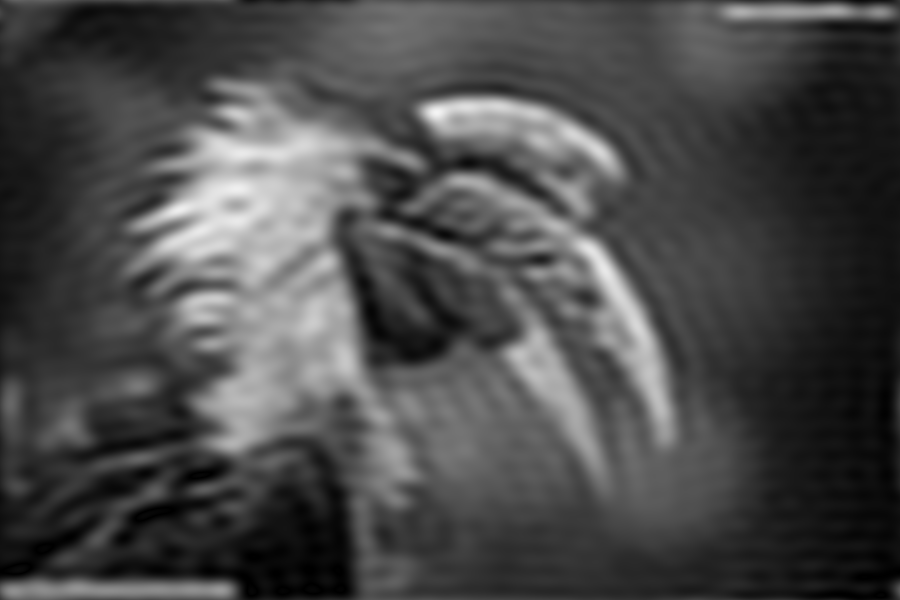

High pass Filtered Image


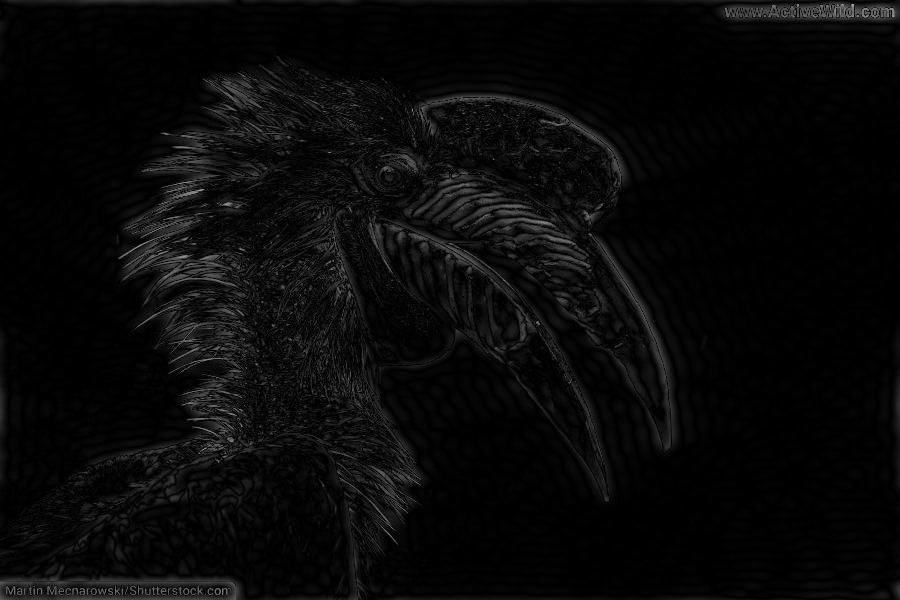

In [ ]:
# Step 6: Display Results
print("Original Image: ")
cv2_imshow(img)

print("Low-pass filtered image (smoothed): ")
cv2_imshow(np.uint8(img_lp))

print("High pass Filtered Image")
cv2_imshow(np.uint8(img_hp))